In [1]:
#cell 1
import torch
import copy
import numpy as np
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline

# Add the parent directory to the Python path - bad practice, but it's just for the example
import sys
sys.path.append("/home/heydari/FHHI-XAI/")

device = "cuda:0" if torch.cuda.is_available() else "cpu"

from src.glocal_analysis import run_analysis 
from src.datasets.flood_dataset import FloodDataset
from src.datasets.DLR_dataset import DatasetDLR
from src.plot_crp_explanations import plot_explanations, plot_one_image_explanation
from src.minio_client import MinIOClient
from LCRP.models import get_model 
from LCRP.utils.crp_configs import ATTRIBUTORS, CANONIZERS, VISUALIZATIONS, COMPOSITES

import logging
# Suppress specific noisy libraries if needed
logging.getLogger("PIL").setLevel(logging.WARNING)
logging.getLogger("matplotlib").setLevel(logging.WARNING)
logging.getLogger("numba").setLevel(logging.WARNING)



/home/heydari/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#cell 2

# --- imports
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
import tqdm
from src.datasets.flood_dataset import FloodDataset

# --- data / transforms
transform = transforms.Compose([
    transforms.ToTensor(),
])

root_dir = "../data/BRK-data/"
dataset = FloodDataset(root_dir=root_dir, split="train", transform=transform)
print('Loaded dataset:', type(dataset))
print('len(dataset) =', len(dataset))

# --- device
device = "cuda:0" if torch.cuda.is_available() else "cpu"

# --- model / checkpoint
model_name = "pidnet"
ckpt_path = "../models/flood_model.pt"

# ========= HACK: prevent get_model()/get_pidnet() from trying to strictly load its OWN checkpoint =========
# Some internal path calls `model.load_state_dict(torch.load(cfg["ckpt_path"]))` with strict=True,
# which raises due to "model." prefix or different head. We temporarily force:
#   - torch.load -> always map to CPU (safe on CPU-only)
#   - nn.Module.load_state_dict -> always use strict=False
_orig_torch_load = torch.load
_orig_load_state_dict = torch.nn.Module.load_state_dict

def _cpu_load(*args, **kwargs):
    kwargs.setdefault("map_location", "cpu")
    return _orig_torch_load(*args, **kwargs)

def _lenient_load_state_dict(self, state_dict, strict=True):
    # Force non-strict to avoid internal RuntimeError during model construction
    return _orig_load_state_dict(self, state_dict, strict=False)

torch.load = _cpu_load
torch.nn.Module.load_state_dict = _lenient_load_state_dict
try:
    # Build the model; any internal checkpoint load will be lenient and won't crash
    model = get_model(model_name=model_name, device=device, classes=2)
finally:
    # Restore patched functions
    torch.load = _orig_torch_load
    torch.nn.Module.load_state_dict = _orig_load_state_dict

# ========= Now load YOUR checkpoint properly (handle "model." / "module." prefixes) =========
def _extract_state_dict(obj):
    if isinstance(obj, dict):
        for k in ("state_dict", "model_state", "model", "net", "module"):
            if k in obj and isinstance(obj[k], dict):
                return obj[k]
    return obj

def _strip_prefix(sd, prefix):
    if any(k.startswith(prefix) for k in sd.keys()):
        return {k[len(prefix):]: v for k, v in sd.items()}
    return sd

raw_sd = torch.load(ckpt_path, map_location="cpu")
sd = _extract_state_dict(raw_sd)
sd = _strip_prefix(sd, "model.")
sd = _strip_prefix(sd, "module.")

missing, unexpected = model.load_state_dict(sd, strict=False)
if missing:
    print("[load_state_dict] Missing keys:", len(missing))
    # print(missing)  # uncomment for full list
if unexpected:
    print("[load_state_dict] Unexpected keys:", len(unexpected))
    # print(unexpected)  # uncomment for full list

# finalize
model.to(device)
model.eval()
model.augment = False

output_dir = "../examples/output/crp/pidnet_flood_BRK"
print(f"Model ready on {device}. Output dir: {output_dir}")


Loaded dataset: <class 'src.datasets.flood_dataset.FloodDataset'>
len(dataset) = 1321
Loaded checkpoint ../models/flood_model.pt
Model ready on cuda:0. Output dir: ../examples/output/crp/pidnet_flood_BRK


In [3]:
#cell 3
# --- validation evaluation: Mean IoU, Pixel Acc, Mean Acc, per-class IoU
import numpy as np
import torch
import torch.nn.functional as F
from types import SimpleNamespace
from pathlib import Path as PathlibPath
from torch.utils.data import DataLoader
from tqdm import tqdm
from src.datasets.flood_dataset import FloodDataset
from src.utils.utils import get_confusion_matrix

# minimal config matching the previous general_flood_v3 settings
cfg = SimpleNamespace(
    DATASET=SimpleNamespace(
        NUM_CLASSES=2,
    ),
    MODEL=SimpleNamespace(
        NUM_OUTPUTS=1,
        ALIGN_CORNERS=True,
    ),
    TEST=SimpleNamespace(
        OUTPUT_INDEX=-1,
        BASE_SIZE=2048,
        IMAGE_SIZE=[1280, 720],
    ),
    TRAIN=SimpleNamespace(
        IGNORE_LABEL=-1,
        SCALE_FACTOR=16,
    ),
)

val_root = PathlibPath("../data/BRK-data/").resolve()
val_dataset = FloodDataset(
    root_dir=str(val_root),
    split="val",
    transform=transform,
)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=0)

# quick sanity check on paired counts

print("Validation samples (paired):", len(val_dataset))

def evaluate_val(model, loader, cfg, device=device):
    model.eval()
    confusion = np.zeros((cfg.DATASET.NUM_CLASSES, cfg.DATASET.NUM_CLASSES))
    with torch.no_grad():
        for image, label, _, _, _, _ in tqdm(loader, total=len(loader), desc="val"):
            image = image.to(device)
            label = label.to(device)

            pred = val_dataset.single_scale_inference(cfg, model, image)
            if pred.shape[-2:] != label.shape[-2:]:
                pred = F.interpolate(
                    pred, label.shape[-2:], mode="bilinear", align_corners=cfg.MODEL.ALIGN_CORNERS
                )

            confusion += get_confusion_matrix(
                label, pred, label.size(), cfg.DATASET.NUM_CLASSES, cfg.TRAIN.IGNORE_LABEL
            )

    pos = confusion.sum(1)
    res = confusion.sum(0)
    tp = np.diag(confusion)
    pixel_acc = tp.sum() / pos.sum()
    mean_acc = (tp / np.maximum(1.0, pos)).mean()
    class_iou = tp / np.maximum(1.0, pos + res - tp)
    mean_iou = class_iou.mean()

    print(f"Pixel_Acc: {pixel_acc:.4f}")
    print(f"Mean_Acc: {mean_acc:.4f}")
    print(f"Mean_IoU: {mean_iou:.4f}")
    for idx, iou in enumerate(class_iou):
        print(f"Class {idx} IoU: {iou:.4f}")

    return mean_iou, class_iou, pixel_acc, mean_acc



Validation samples (paired): 244


In [ ]:
#cell 4

# --- validation evaluation: Mean IoU, Pixel Acc, Mean Acc, per-class IoU
import numpy as np
import torch
import torch.nn.functional as F
from types import SimpleNamespace
from pathlib import Path as PathlibPath
from torch.utils.data import DataLoader
from tqdm import tqdm

from src.datasets.flood_dataset_metrics import FloodDataset
from src.utils.utils import get_confusion_matrix

# minimal config (only things we actually need here)
cfg = SimpleNamespace(
    DATASET=SimpleNamespace(
        NUM_CLASSES=2,
    ),
    MODEL=SimpleNamespace(
        NUM_OUTPUTS=1,
        ALIGN_CORNERS=True,
    ),
    TEST=SimpleNamespace(
        OUTPUT_INDEX=-1,
        BASE_SIZE=2048,
        IMAGE_SIZE=[1280, 720],
    ),
    TRAIN=SimpleNamespace(
        IGNORE_LABEL=-1,   # just a default; real value comes from dataset
        SCALE_FACTOR=16,
    ),
)

# root should point to folder that either contains "General_Flood_v3"
# or is itself the General_Flood_v3 folder
val_root = PathlibPath("../data").resolve()

val_dataset = FloodDataset(
    root_dir=str(val_root),
    split="val",
    transform=transform,
    multi_scale=False,
    flip=False,
    # NOTE: we do NOT pass ignore_label here -> use FloodDataset's default
    base_size=cfg.TEST.BASE_SIZE,
    crop_size=(cfg.TEST.IMAGE_SIZE[1], cfg.TEST.IMAGE_SIZE[0]),
    scale_factor=cfg.TRAIN.SCALE_FACTOR,
    return_or_dims=True,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=0)

# quick sanity check on paired counts + ignore label
print("Validation samples (paired):", len(val_dataset))
print("Dataset ignore_label:", getattr(val_dataset, "ignore_label", None))

def evaluate_val(model, loader, cfg, device):
    model.eval()
    confusion = np.zeros((cfg.DATASET.NUM_CLASSES, cfg.DATASET.NUM_CLASSES))
    # take ignore_label from the dataset, fall back to cfg if missing
    ignore_label = getattr(loader.dataset, "ignore_label", cfg.TRAIN.IGNORE_LABEL)

    with torch.no_grad():
        # optional: one-time debug flag to inspect ignore pixels
        debug_once = True

        for image, label, _, _, _, _ in tqdm(loader, total=len(loader), desc="val"):
            image = image.to(device)
            label = label.to(device)

            pred = loader.dataset.single_scale_inference(cfg, model, image)
            if pred.shape[-2:] != label.shape[-2:]:
                pred = F.interpolate(
                    pred,
                    label.shape[-2:],
                    mode="bilinear",
                    align_corners=cfg.MODEL.ALIGN_CORNERS,
                )

            # Optional debug: see how many pixels are actually ignored
            if debug_once:
                n_ignore = (label == ignore_label).sum().item()
                n_total = label.numel()
                print(f"Ignore pixels in first batch: {n_ignore}/{n_total}")
                debug_once = False

            confusion += get_confusion_matrix(
                label,
                pred,
                label.size(),
                cfg.DATASET.NUM_CLASSES,
                ignore_label,   # <-- using dataset's ignore_label
            )

    pos = confusion.sum(1)
    res = confusion.sum(0)
    tp = np.diag(confusion)

    pixel_acc = tp.sum() / pos.sum()
    mean_acc = (tp / np.maximum(1.0, pos)).mean()
    class_iou = tp / np.maximum(1.0, pos + res - tp)
    mean_iou = class_iou.mean()

    print(f"Pixel_Acc: {pixel_acc:.4f}")
    print(f"Mean_Acc:  {mean_acc:.4f}")
    print(f"Mean_IoU:  {mean_iou:.4f}")
    for idx, iou in enumerate(class_iou):
        print(f"Class {idx} IoU: {iou:.4f}")

    return mean_iou, class_iou, pixel_acc, mean_acc


In [ ]:
#cell 5
mean_iou, class_iou, pixel_acc, mean_acc = evaluate_val(model, val_loader, cfg, device)
print("Returned:", mean_iou, class_iou, pixel_acc, mean_acc)


In [ ]:
#cell 6

# --- imports
import torch
from torchvision import transforms
from src.datasets.flood_datase_crp import FloodDataset 
output_dir = "../examples/output/crp/CRP-BRK-NEW"
# --- data / transforms
transform = transforms.Compose([
    transforms.ToTensor(),
])

root_dir = "../data/BRK-data/"
dataset = FloodDataset(root_dir=root_dir, split="train", transform=transform)
print('Loaded dataset:', type(dataset))
print('len(dataset) =', len(dataset))

run_analysis(model_name, model, dataset, output_dir=output_dir, device=device)

Loaded dataset: <class 'src.datasets.flood_datase_crp.FloodDataset'>
len(dataset) = 1321
torch.Size([3, 1280, 720])
MEMORY STARTING: 0.03GB (max: 0.03GB)
MEMORY AFTER FIGURE CREATION: 0.04GB (max: 0.04GB)
MEMORY BEFORE SEGMENTATION ATTR: 0.04GB (max: 0.04GB)


/home/heydari/.local/lib/python3.10/site-packages/torch/cuda/memory.py:282: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
ERROR:LCRP.utils.crp:Prediction time: 0.15919971466064453, Backward time: 0.23821377754211426, Full attribution time: 0.259840726852417
DEBUG:src.plot_crp_explanations:Time to compute conditional heatmaps: 0.00s


MEMORY AFTER SEGMENTATION ATTR: 0.04GB (max: 0.04GB)
MEMORY AFTER DETECTION/SEGMENTATION: 0.04GB (max: 0.04GB)
Concepts: torch.return_types.topk(
values=tensor([0.0972, 0.0880, 0.0858]),
indices=tensor([ 34, 116, 176]))
Computing reference images...
MEMORY BEFORE REF IMAGES: 0.04GB (max: 0.04GB)


ERROR:LCRP.utils.crp:Prediction time: 0.2001352310180664, Backward time: 0.35536956787109375, Full attribution time: 0.3725709915161133
ERROR:LCRP.utils.crp:Prediction time: 0.13708281517028809, Backward time: 0.31363987922668457, Full attribution time: 0.32440686225891113
ERROR:LCRP.utils.crp:Prediction time: 0.13667702674865723, Backward time: 0.3437819480895996, Full attribution time: 0.3652477264404297
ERROR:LCRP.utils.crp:Prediction time: 0.13440656661987305, Backward time: 0.34147095680236816, Full attribution time: 0.3486318588256836
ERROR:LCRP.utils.crp:Prediction time: 0.13576149940490723, Backward time: 0.3664112091064453, Full attribution time: 0.3826782703399658
ERROR:LCRP.utils.crp:Prediction time: 0.13366413116455078, Backward time: 0.3656501770019531, Full attribution time: 0.37906837463378906
ERROR:LCRP.utils.crp:Prediction time: 0.17796778678894043, Backward time: 0.43616414070129395, Full attribution time: 0.44851231575012207
ERROR:LCRP.utils.crp:Prediction time: 0.13

MEMORY AFTER REF IMAGES: 0.04GB (max: 0.04GB)
Plotting...
MEMORY PLOTTING CONCEPT 0: 0.04GB (max: 0.04GB)
MEMORY PLOTTING CONCEPT 1: 0.04GB (max: 0.04GB)
MEMORY PLOTTING CONCEPT 2: 0.04GB (max: 0.04GB)


DEBUG:src.plot_crp_explanations:Time to plot: 0.61s


MEMORY PLOTTING CONCEPT 3: 0.04GB (max: 0.04GB)
MEMORY AFTER PLOTTING: 0.04GB (max: 0.04GB)


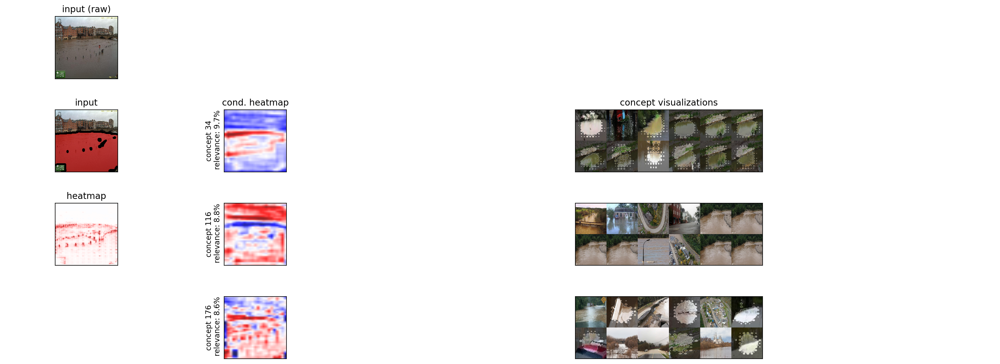

Done plotting.


In [4]:
#cell 7

# Setting up main parameters
from src.datasets.flood_datase_crp import FloodDataset 

class_id = 1
sample_id = 0
n_concepts = 3
n_refimgs = 12
layer = "layer4.2.conv1"
# layer = "layer1.1.conv1"
mode = "activation"
prediction_num = 0

root_dir = "/home/heydari/FHHI-XAI/data/BRK-data/"
dataset = FloodDataset(root_dir=root_dir, split="train", transform=transform)
print('Loaded dataset:', type(dataset))
print('len(dataset) =', len(dataset))


# if failing, try to restart the notebook and do not run analysis again, go directly to plotting
plot_explanations(model_name, model, dataset, sample_id, class_id, layer, prediction_num, mode, n_concepts, n_refimgs, output_dir=output_dir)

In [5]:
#cell 8

import os
from torch.utils.data import DataLoader
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from datetime import datetime
from tqdm import tqdm
from torchvision.utils import make_grid

# === CRP & Zennit ===
import zennit.image as zimage
from crp.image import imgify
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.concepts import ChannelConcept


In [ ]:
#cell 9

from collections import defaultdict

dataloader = DataLoader(dataset, batch_size=4, shuffle=False, num_workers=8)
cc = ChannelConcept()
output_dir_crp = "../examples/output/crp/CRP-BRK-NEW/"

layer_names = get_layer_names(model, [torch.nn.Conv2d])
attribution = ATTRIBUTORS[model_name](model)
composite = COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()])
condition = [{"y": class_id}]
fv = VISUALIZATIONS[model_name](
    attribution, dataset, layer_names,
    preprocess_fn=lambda x: x, path=output_dir_crp, max_target="max"
)

device = "cuda:0" if torch.cuda.is_available() else "cpu"
model.to(device).eval()

#start = datetime.now()
activations = defaultdict(list)
attributions = defaultdict(list)

for i, (x, y) in enumerate(tqdm(dataset)):
    x = x.to(device).requires_grad_()
    attr = attribution(x.unsqueeze(0), condition, composite, record_layer=layer_names)

    for ln in layer_names:
        if ln not in attr.activations or ln not in attr.relevances:
            continue

        acts = attr.activations[ln].amax((-2, -1)).detach().cpu()
        rels = cc.attribute(attr.relevances[ln], abs_norm=True).detach().cpu()
        acts = torch.nan_to_num(acts, nan=0.0, posinf=0.0, neginf=0.0)
        rels = torch.nan_to_num(rels, nan=0.0, posinf=0.0, neginf=0.0)

        activations[ln].append(acts)
        attributions[ln].append(rels)

for ln, act_list in activations.items():
    if not attributions[ln]:
        continue

    act_tensor = torch.nan_to_num(torch.cat(act_list), nan=0.0, posinf=0.0, neginf=0.0)
    rel_tensor = torch.nan_to_num(torch.cat(attributions[ln]), nan=0.0, posinf=0.0, neginf=0.0)

    folder = os.path.join("/home/heydari/FHHI-XAI/examples/output/pcx/PCX-BRK-NEW/", ln)
    os.makedirs(folder, exist_ok=True)
    np.save(os.path.join(folder, "activations.npy"), act_tensor.numpy())
    np.save(os.path.join(folder, "attributions.npy"), rel_tensor.numpy())

#end = datetime.now()
#print(f"elapsed: {end - start}")


Loaded dataset: <class 'src.datasets.flood_datase_crp.FloodDataset'>
len(dataset) = 1321
[plot_pcx_explanations] starting
[plot_pcx_explanations] sample_id=199 img.shape=(3, 1280, 720)
[plot_one_image_pcx_explanation] device=cpu, layer=layer4.2.conv1
[attr] building attribution/composite/visualization
[attr] layer_map size=79
[data] x.shape=(1, 3, 1280, 720)
[attr] computing base attribution
[attr] base heatmap computed
[mask] building predicted mask
[mask] reverse_augmentation available, target size=(1280, 720)
[mask] resized mask -> (1280, 720)
[concepts] computing channel relevances
[concepts] channel_rels shape=(1, 256)
[concepts] topk_ind=[141, 216, 70, 0, 4] topk_rel=[0.0430000014603138, 0.03500000014901161, 0.03400000184774399, 0.017999999225139618, 0.0010000000474974513]
[attr] computing conditional heatmaps
[refs] computing/loading reference images
[get_ref_images] start; layer=layer4.2.conv1, n_ref=12, cache=../examples/new-ref-img-BRK/layer4.2.conv1.h5
[get_ref_images] cache

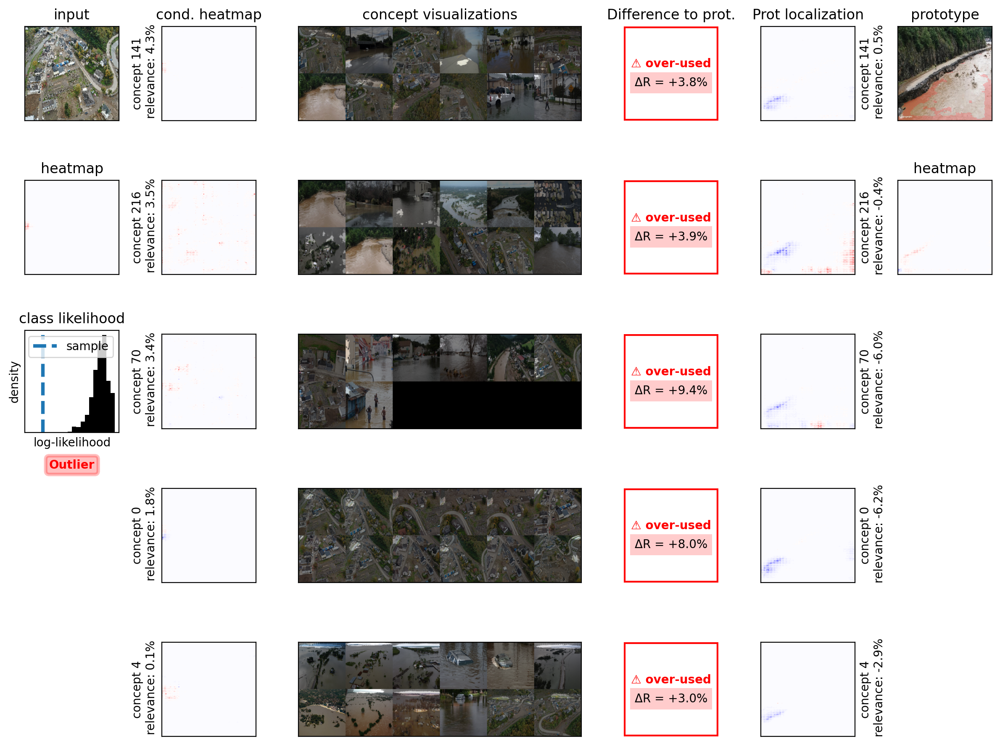

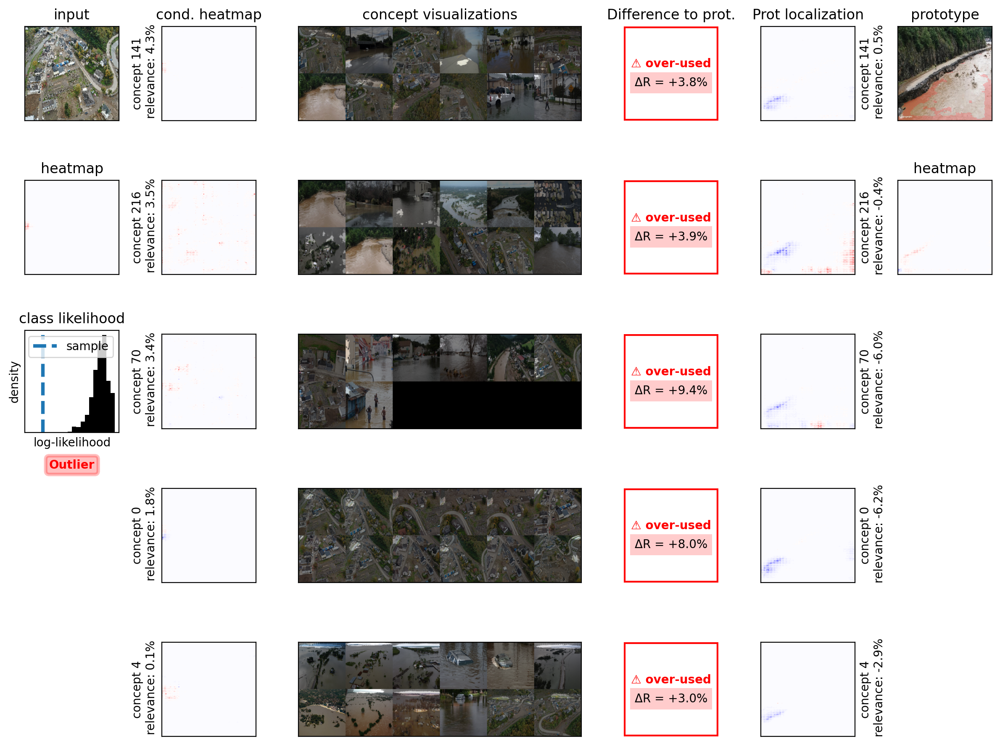

In [30]:
#cell 10

import os
from src.plot_pcx_pidnet_new import plot_pcx_explanations
root_dir = "../data/BRK-data/"
dataset = FloodDataset(root_dir=root_dir, split="train", transform=transform)
print('Loaded dataset:', type(dataset))
print('len(dataset) =', len(dataset))

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# Use parent-relative paths because this notebook lives in the `examples/` folder
output_dir_crp = "../examples/output/crp/CRP-BRK-NEW/"
output_dir_pcx = "../examples/output/pcx/PCX-BRK-NEW/"




plot_pcx_explanations(
    "pidnet",
    model.to(device),
    dataset,
    sample_id=199,
    layer_name='layer4.2.conv1',
    n_concepts=5,
    n_refimgs=12,
    num_prototypes=5,
    ref_imgs_path="../examples/new-ref-img-BRK",
    output_dir_crp=output_dir_crp,
    output_dir_pcx=output_dir_pcx,
)


In [28]:
# check why a sample is Ordinary
import numpy as np
from sklearn.mixture import GaussianMixture

layer_name = "layer4.2.conv1"
output_dir_pcx = "../examples/output/pcx/PCX-BRK-NEW/"
sample_id = 886  # change to the sample in your plot

X = np.load(f"{output_dir_pcx}/{layer_name}/attributions.npy")
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
gmm = GaussianMixture(n_components=7, reg_covar=1e-5, random_state=0).fit(X)
scores = gmm.score_samples(X)
p1 = np.percentile(scores, 1)

print("score:", scores[sample_id])
print("p1:", p1)
print("label:", "Outlier" if scores[sample_id] < p1 else "Ordinary")


score: 1192.7601
p1: 1171.7391845703125
label: Ordinary


In [29]:
# Find outliers by GMM p1 threshold (same as plot_pcx_explanations)
import numpy as np
from sklearn.mixture import GaussianMixture

layer_name = "layer4.2.conv1"
output_dir_pcx = "../examples/output/pcx/PCX-BRK-NEW/"
n_outliers = 20

X = np.load(f"{output_dir_pcx}/{layer_name}/attributions.npy")
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)

gmm = GaussianMixture(n_components=7, reg_covar=1e-5, random_state=0).fit(X)
scores = gmm.score_samples(X)

p1 = np.percentile(scores, 1)
outlier_idx = np.where(scores < p1)[0]

# sort outliers by score (lowest first)
outlier_idx = outlier_idx[np.argsort(scores[outlier_idx])]

print("Outlier indices (p1 threshold):")
print(outlier_idx[:n_outliers].tolist())

print("\nLowest-score outliers (idx, score):")
for i in outlier_idx[:n_outliers]:
    print(int(i), float(scores[i]))


Outlier indices (p1 threshold):
[199, 384, 66, 211, 791, 619, 32, 209, 1020, 841, 228, 842, 549, 87]

Lowest-score outliers (idx, score):
199 1160.214111328125
384 1161.031982421875
66 1162.2415771484375
211 1165.5882568359375
791 1165.947509765625
619 1166.3409423828125
32 1166.3485107421875
209 1167.38037109375
1020 1167.8865966796875
841 1170.5955810546875
228 1170.609130859375
842 1170.7320556640625
549 1171.4854736328125
87 1171.7119140625


In [24]:
import numpy as np
from sklearn.mixture import GaussianMixture

layer_name = "layer4.2.conv1"
output_dir_pcx = "../examples/output/pcx/PCX-BRK-NEW/"
n_outliers = 20
sample_id_check = 886  # set to any id you want to verify

# load the exact attribution bank used by plot_pcx_explanations
attr_path = f"{output_dir_pcx}/{layer_name}/attributions.npy"
X = np.load(attr_path)

# drop NaN/Inf and constant rows like plot_pcx_explanations does
finite_mask = np.isfinite(X).all(axis=1)
X = X[finite_mask]
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
nonzero_mask = ~(np.isclose(X.std(axis=1), 0.0) & np.isclose(X.mean(axis=1), 0.0))
X = X[nonzero_mask]

# fit GMM
gmm = GaussianMixture(n_components=7, reg_covar=1e-5, random_state=0).fit(X)
scores = gmm.score_samples(X)

# p1 threshold (same as plot_pcx_explanations)
p1 = np.percentile(scores, 1)
outlier_idx = np.where(scores < p1)[0]

print(f"Outlier indices (p1 threshold): {outlier_idx[:n_outliers].tolist()}")

# check a specific sample
if sample_id_check < len(scores):
    print("sample", sample_id_check, "score", scores[sample_id_check], "label",
          "Outlier" if scores[sample_id_check] < p1 else "Ordinary")
else:
    print("sample_id_check is outside filtered attribution bank index range")


Outlier indices (p1 threshold): [55, 133, 155, 161, 163, 165, 326, 713, 749, 929, 930, 932]
sample 886 score 1199.016 label Ordinary


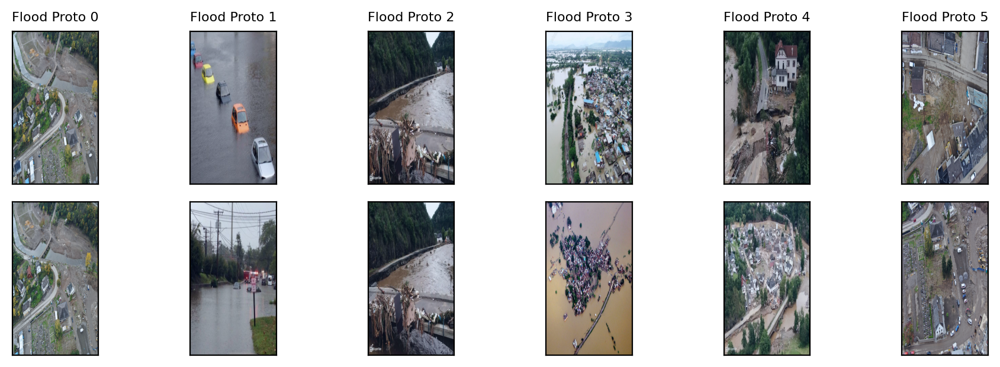

In [21]:
# Robust: 7 prototypes, 2 samples per prototype, skip proto 4, renumber titles
import numpy as np
from sklearn.cluster import KMeans

N_PROTOTYPES = 7
samples_per_proto = 2
skip_proto = 4

X = attributions.detach().cpu().numpy()
unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = [[] for _ in range(N_PROTOTYPES)]

if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        topk = idx[np.argsort(d)[:samples_per_proto]]
        proto_samples[k] = list(map(int, topk))

# fill missing samples globally to keep grid full
used = set(s for lst in proto_samples for s in lst)
remaining = [i for i in range(len(X)) if i not in used]

def pick_farthest(chosen, pool):
    if not pool:
        return None
    if not chosen:
        return pool.pop(0)
    dists = np.min(
        np.linalg.norm(X[pool][:, None, :] - X[list(chosen)][None, :, :], axis=2),
        axis=1
    )
    pick_idx = int(np.argmax(dists))
    return pool.pop(pick_idx)

for k in range(N_PROTOTYPES):
    while len(proto_samples[k]) < samples_per_proto and remaining:
        pick = pick_farthest(used, remaining)
        if pick is None:
            break
        proto_samples[k].append(pick)
        used.add(pick)

# plot 2 rows, 6 columns (skip proto 4), renumber titles
plot_indices = [k for k in range(N_PROTOTYPES) if k != skip_proto]
title_prefix = "Flood Proto"

fig, axs = plt.subplots(
    samples_per_proto,
    len(plot_indices),
    figsize=(1.6 * len(plot_indices), 1.6 * samples_per_proto),
    dpi=200,
    facecolor="white"
)
axs = np.atleast_2d(axs)

for col, proto_k in enumerate(plot_indices):
    for row in range(samples_per_proto):
        ax = axs[row, col]
        if row >= len(proto_samples[proto_k]):
            ax.axis("off")
            continue
        sample_id = proto_samples[proto_k][row]
        img = imgify(dataset[int(sample_id)][0])
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        if row == 0:
            ax.set_title(f"{title_prefix} {col}", fontsize=8)

plt.tight_layout()


In [7]:
#cell 11

# Loading
layer_names = get_layer_names(model, [torch.nn.Conv2d])
layer_name = layer_names[53]
print(layer_name)
folder = f"/home/heydari/FHHI-XAI/examples/output/pcx/PCX-BRK-NEW/{layer_name}/"
attributions = torch.from_numpy(np.load(folder + "attributions.npy"))
activations = torch.from_numpy(np.load(folder + "activations.npy"))
indices = np.arange(len(dataset))

num_prototypes = {
   
}

layer4_d.0.conv1


In [ ]:
#cell 12
from umap import UMAP


embedding_attr = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_attr = embedding_attr.fit_transform(attributions.detach().cpu().numpy())
x_attr, y_attr = X_attr[:, 0], X_attr[:, 1]

embedding_act = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_act = embedding_act.fit_transform(activations.detach().cpu().numpy())
x_act, y_act = X_act[:, 0], X_act[:, 1]

In [ ]:
#cell 13

from scipy import stats
from sklearn.mixture import GaussianMixture

N_PROTOTYPES = 3

fig, axes = plt.subplots(1, 2, dpi=300, figsize=(5, 3), facecolor='white')
for i, X in enumerate([X_attr, X_act]):
    x, y = X[:, 0], X[:, 1]
    xmin = x.min() - 2
    xmax = x.max() + 2
    ymin = y.min() - 2
    ymax = y.max() + 2
    X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    values = np.vstack([x, y])
    kernel = stats.gaussian_kde(values, 0.5)
    Z = np.reshape(kernel(positions).T, X.shape).T
    axes[i].contour(Z, extent=[xmin, xmax, ymin, ymax], cmap="Greys", alpha=0.3, extend='min', vmax=Z.max() * 1, zorder=0)
    axes[i].scatter(x, y, s=3, alpha=0.7, zorder=1)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_title(["attributions", "activations"][i])
    axes[i].plot([1], y[1], 'ko', markersize=5, label="test image")
    axes[i].legend()


prototypes = []
gmms = []
for i, (X, emb) in enumerate([(attributions, embedding_attr), (activations, embedding_act)]):
    gmms.append(GaussianMixture(n_components=N_PROTOTYPES, random_state=None, n_init=10).fit(X.detach().cpu().numpy()))
    prototypes.append(gmms[-1].means_)
    mean = emb.transform(gmms[-1].means_)
    axes[i].scatter(mean[:, 0], mean[:, 1], s=30, c="#1B4365", zorder=2, label="prototypes")
    for k, prot in enumerate(mean):
        axes[i].text(prot[0], prot[1], k, fontsize=4, color="white", ha="center", va="center")
    axes[i].legend()

plt.tight_layout()
fig.show()

In [ ]:
#cell 13

print("Layer name:", layer_name)
print("X shape:", X.shape)
print("Unique values in X:", len(np.unique(X.detach().cpu().numpy().flatten())))
print("N_PROTOTYPES:", N_PROTOTYPES)
print("Mode:", mode)
print("X min/max:", X.min().item(), X.max().item())
print("Layer names:", layer_names)

In [ ]:
# 5 prototypes, 1 sample each (from scratch)
import numpy as np
from sklearn.cluster import KMeans

N_PROTOTYPES = 5
samples_per_proto = 1

X = attributions.detach().cpu().numpy()

kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
labels = kmeans.fit_predict(X)
centers = kmeans.cluster_centers_

# closest sample to each cluster center
proto_samples = []
for k in range(N_PROTOTYPES):
    idx = np.where(labels == k)[0]
    if len(idx) == 0:
        proto_samples.append(-1)
        continue
    d = np.linalg.norm(X[idx] - centers[k], axis=1)
    proto_samples.append(int(idx[np.argmin(d)]))

# plot one row, five columns
title_prefix = "Flood Proto"
fig, axs = plt.subplots(
    1,
    N_PROTOTYPES,
    figsize=(1.8 * N_PROTOTYPES, 2.4),
    dpi=200,
    facecolor="white"
)
axs = np.atleast_1d(axs)

for col in range(N_PROTOTYPES):
    ax = axs[col]
    sample_id = proto_samples[col]
    if sample_id < 0:
        ax.axis("off")
        continue
    img = imgify(dataset[sample_id][0])
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"{title_prefix} {col}", fontsize=8)

plt.tight_layout()


In [ ]:
# Robust: always return 5 prototype samples
import numpy as np
from sklearn.cluster import KMeans

N_PROTOTYPES = 7
X = attributions.detach().cpu().numpy()

# if attributions are too degenerate, fall back to activations
unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

# cluster if possible
labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = []

if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            proto_samples.append(-1)
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        proto_samples.append(int(idx[np.argmin(d)]))

# fill missing or if clustering wasn't possible
if len(proto_samples) < N_PROTOTYPES or any(s < 0 for s in proto_samples):
    chosen = [s for s in proto_samples if s >= 0]
    remaining = [i for i in range(len(X)) if i not in chosen]
    # greedy farthest-point selection to diversify
    while len(chosen) < N_PROTOTYPES and remaining:
        if not chosen:
            chosen.append(remaining.pop(0))
            continue
        dists = np.min(
            np.linalg.norm(X[remaining][:, None, :] - X[chosen][None, :, :], axis=2),
            axis=1
        )
        pick = remaining[int(np.argmax(dists))]
        chosen.append(pick)
        remaining.remove(pick)
    proto_samples = chosen[:N_PROTOTYPES]

# plot one row, five columns
title_prefix = "Flood Proto"
fig, axs = plt.subplots(
    1, N_PROTOTYPES, figsize=(1.8 * N_PROTOTYPES, 2.4), dpi=200, facecolor="white"
)
axs = np.atleast_1d(axs)

for col in range(N_PROTOTYPES):
    ax = axs[col]
    sample_id = proto_samples[col]
    img = imgify(dataset[int(sample_id)][0])
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"{title_prefix} {col}", fontsize=8)

plt.tight_layout()


In [ ]:
# Robust: 7 prototypes, 3 samples per prototype
import numpy as np
from sklearn.cluster import KMeans

N_PROTOTYPES = 7
samples_per_proto = 3

X = attributions.detach().cpu().numpy()
unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = [[] for _ in range(N_PROTOTYPES)]

if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        topk = idx[np.argsort(d)[:samples_per_proto]]
        proto_samples[k] = list(map(int, topk))

# fill missing samples globally to keep grid full
used = set(s for lst in proto_samples for s in lst)
remaining = [i for i in range(len(X)) if i not in used]

def pick_farthest(chosen, pool):
    if not pool:
        return None
    if not chosen:
        return pool.pop(0)
    dists = np.min(
        np.linalg.norm(X[pool][:, None, :] - X[list(chosen)][None, :, :], axis=2),
        axis=1
    )
    pick_idx = int(np.argmax(dists))
    return pool.pop(pick_idx)

for k in range(N_PROTOTYPES):
    while len(proto_samples[k]) < samples_per_proto and remaining:
        pick = pick_farthest(used, remaining)
        if pick is None:
            break
        proto_samples[k].append(pick)
        used.add(pick)

# plot 3 rows, 7 columns
title_prefix = "Flood Proto"
fig, axs = plt.subplots(
    samples_per_proto,
    N_PROTOTYPES,
    figsize=(1.6 * N_PROTOTYPES, 1.6 * samples_per_proto),
    dpi=200,
    facecolor="white"
)
axs = np.atleast_2d(axs)

for col in range(N_PROTOTYPES):
    for row in range(samples_per_proto):
        ax = axs[row, col]
        if row >= len(proto_samples[col]):
            ax.axis("off")
            continue
        sample_id = proto_samples[col][row]
        img = imgify(dataset[int(sample_id)][0])
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        if row == 0:
            ax.set_title(f"{title_prefix} {col}", fontsize=8)

plt.tight_layout()


In [ ]:
# Robust: 7 prototypes, 2 samples per prototype, skip proto 4, renumber titles
import numpy as np
from sklearn.cluster import KMeans

N_PROTOTYPES = 7
samples_per_proto = 2
skip_proto = 4

X = attributions.detach().cpu().numpy()
unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = [[] for _ in range(N_PROTOTYPES)]

if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        topk = idx[np.argsort(d)[:samples_per_proto]]
        proto_samples[k] = list(map(int, topk))

# fill missing samples globally to keep grid full
used = set(s for lst in proto_samples for s in lst)
remaining = [i for i in range(len(X)) if i not in used]

def pick_farthest(chosen, pool):
    if not pool:
        return None
    if not chosen:
        return pool.pop(0)
    dists = np.min(
        np.linalg.norm(X[pool][:, None, :] - X[list(chosen)][None, :, :], axis=2),
        axis=1
    )
    pick_idx = int(np.argmax(dists))
    return pool.pop(pick_idx)

for k in range(N_PROTOTYPES):
    while len(proto_samples[k]) < samples_per_proto and remaining:
        pick = pick_farthest(used, remaining)
        if pick is None:
            break
        proto_samples[k].append(pick)
        used.add(pick)

# plot 2 rows, 6 columns (skip proto 4), renumber titles
plot_indices = [k for k in range(N_PROTOTYPES) if k != skip_proto]
title_prefix = "Flood Proto"

fig, axs = plt.subplots(
    samples_per_proto,
    len(plot_indices),
    figsize=(1.6 * len(plot_indices), 1.6 * samples_per_proto),
    dpi=200,
    facecolor="white"
)
axs = np.atleast_2d(axs)

for col, proto_k in enumerate(plot_indices):
    for row in range(samples_per_proto):
        ax = axs[row, col]
        if row >= len(proto_samples[proto_k]):
            ax.axis("off")
            continue
        sample_id = proto_samples[proto_k][row]
        img = imgify(dataset[int(sample_id)][0])
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        if row == 0:
            ax.set_title(f"{title_prefix} {col}", fontsize=8)

plt.tight_layout()


In [ ]:
# 7 prototypes (skip 4), 2 samples each, 5 concepts + right-side refs (scaled)
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from crp.concepts import ChannelConcept
from crp.image import imgify

from src.plot_pcx_pidnet_new import get_ref_images

# ---- config ----
N_PROTOTYPES = 7
samples_per_proto = 2
skip_proto = 4
n_concepts = 5
title_prefix = "Flood Proto"
n_refimgs = 8
ref_imgs_path = globals().get("ref_imgs_path", "../examples/new-ref-img-BRK")
layer_name = "layer4.2.conv1"
class_id_use = class_id if "class_id" in globals() else 1

# ---- clustering (robust) ----
X = attributions.detach().cpu().numpy()
unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = [[] for _ in range(N_PROTOTYPES)]
if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        topk = idx[np.argsort(d)[:samples_per_proto]]
        proto_samples[k] = list(map(int, topk))

# fill missing samples globally
used = set(s for lst in proto_samples for s in lst)
remaining = [i for i in range(len(X)) if i not in used]

def pick_farthest(chosen, pool):
    if not pool:
        return None
    if not chosen:
        return pool.pop(0)
    dists = np.min(
        np.linalg.norm(X[pool][:, None, :] - X[list(chosen)][None, :, :], axis=2),
        axis=1
    )
    pick_idx = int(np.argmax(dists))
    return pool.pop(pick_idx)

for k in range(N_PROTOTYPES):
    while len(proto_samples[k]) < samples_per_proto and remaining:
        pick = pick_farthest(used, remaining)
        if pick is None:
            break
        proto_samples[k].append(pick)
        used.add(pick)

# ---- concepts per sample ----
device = next(model.parameters()).device
model.eval()

attribution = ATTRIBUTORS[model_name](model)
composite = COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()])
cc = ChannelConcept()

# ensure fv exists for reference images
if "fv" not in globals():
    layer_names = get_layer_names(model, [torch.nn.Conv2d])
    fv = VISUALIZATIONS[model_name](
        attribution, dataset, layer_names,
        preprocess_fn=lambda x: x, path=output_dir_crp, max_target="max"
    )

def top_concepts_for_sample(sample_id, k=5):
    x, _ = dataset[sample_id]
    x = x.to(device).requires_grad_()
    attr = attribution(x.unsqueeze(0), [{"y": class_id_use}], composite, record_layer=[layer_name])

    # abs-normalized per-channel relevance
    rels = cc.attribute(attr.relevances[layer_name], abs_norm=True)[0]
    topk = torch.topk(rels, k=k)
    idx = topk.indices.detach().cpu().numpy()
    vals = topk.values.detach().cpu().numpy()
    return idx, vals

plot_indices = [k for k in range(N_PROTOTYPES) if k != skip_proto]
rows_per_sample = n_concepts + 1
total_rows = samples_per_proto * rows_per_sample
total_cols = len(plot_indices) + 1  # right-side column

fig, axs = plt.subplots(
    total_rows, total_cols,
    figsize=(1.6 * total_cols, 0.5 * total_rows + 1.5),
    dpi=200,
    facecolor="white"
)
axs = np.atleast_2d(axs)

concept_scores = {}
concept_cache = {}
scale = 1e4  # display scaling

for col, proto_k in enumerate(plot_indices):
    for s in range(samples_per_proto):
        row_base = s * rows_per_sample
        sample_id = proto_samples[proto_k][s]

        ax_img = axs[row_base, col]
        img = imgify(dataset[int(sample_id)][0])
        ax_img.imshow(img)
        ax_img.set_xticks([]); ax_img.set_yticks([])
        if s == 0:
            ax_img.set_title(f"{title_prefix} {col}", fontsize=8)

        if sample_id not in concept_cache:
            concept_ids, concept_vals = top_concepts_for_sample(sample_id, k=n_concepts)
            concept_cache[sample_id] = (concept_ids, concept_vals)
        else:
            concept_ids, concept_vals = concept_cache[sample_id]

        vmax = float(np.max(concept_vals)) if len(concept_vals) else 1.0
        if vmax == 0:
            vmax = 1.0

        for r in range(n_concepts):
            ax_c = axs[row_base + 1 + r, col]
            val = float(concept_vals[r])
            norm = val / vmax
            ax_c.set_facecolor(plt.get_cmap("Reds")(norm))
            ax_c.text(
                0.5, 0.5,
                f"Concept {int(concept_ids[r])}\nval={val*scale:.3f}e-4",
                ha="center", va="center", fontsize=6, color="black"
            )
            ax_c.set_xticks([]); ax_c.set_yticks([])
            for spine in ax_c.spines.values():
                spine.set_visible(True)

            concept_scores[int(concept_ids[r])] = concept_scores.get(int(concept_ids[r]), 0.0) + val

# ---- right-side concept reference strips ----
right_col = total_cols - 1
for r in range(total_rows):
    axs[r, right_col].axis("off")

top_concepts = [c for c, _ in sorted(concept_scores.items(), key=lambda kv: kv[1], reverse=True)[:n_concepts]]
ref_imgs = get_ref_images(
    fv=fv, topk_ind=top_concepts, layer_name=layer_name,
    composite=composite, n_ref=n_refimgs, ref_imgs_save_path=ref_imgs_path
)

for i, cid in enumerate(top_concepts):
    ax = axs[i + 1, right_col]
    ax.axis("on")
    ax.set_title(f"Concept {cid} refs", fontsize=7)
    ax.set_xticks([]); ax.set_yticks([])
    imgs = ref_imgs.get(int(cid), [])
    if imgs:
        row_imgs = []
        for im in imgs[:n_refimgs]:
            row_imgs.append(torch.from_numpy(np.array(im)).permute(2, 0, 1))
        grid = torch.cat(list(row_imgs), dim=2)
        ax.imshow(grid.permute(1, 2, 0))
    else:
        ax.text(0.5, 0.5, "no refs", ha="center", va="center", fontsize=6)

plt.tight_layout()


In [ ]:
# quick check for relevances at layer4.2.conv1
layer_name = "layer4.2.conv1"

x, _ = dataset[0]
x = x.to(next(model.parameters()).device).requires_grad_()
attr = ATTRIBUTORS[model_name](model)(x.unsqueeze(0), [{"y": class_id}], COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()]), record_layer=[layer_name])

rel = attr.relevances[layer_name]
print("relevances shape:", rel.shape)
print("min/max:", rel.min().item(), rel.max().item())
print("sum abs:", rel.abs().sum().item())


In [ ]:
from umap import UMAP


embedding_attr = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_attr = embedding_attr.fit_transform(attributions.detach().cpu().numpy())
x_attr, y_attr = X_attr[:, 0], X_attr[:, 1]

embedding_act = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_act = embedding_act.fit_transform(activations.detach().cpu().numpy())
x_act, y_act = X_act[:, 0], X_act[:, 1]

In [ ]:
from pathlib import Path
import datetime

p = Path("/home/heydari/FHHI-XAI/examples/output/pcx/pidnet_flood_BRK/layer3.1.conv2/activations.npy")
mtime = p.stat().st_mtime
print("mtime (timestamp):", mtime)
print("mtime (human):", datetime.datetime.fromtimestamp(mtime))

In [ ]:
dataloader = DataLoader(dataset, batch_size=4, shuffle=False, num_workers=8)
cc = ChannelConcept()

layer_names = get_layer_names(model, [torch.nn.Conv2d])
# # Setting up CRP 
attribution = ATTRIBUTORS[model_name](model)
composite = COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()])
condition = [{"y": 1}]  
fv = VISUALIZATIONS[model_name](attribution,
                                 dataset,
                                 layer_names,
                                 preprocess_fn=lambda x: x,
                                 path=output_dir,
                                 max_target="max")

# # Runs faster on MPS
#device = "mps"
model.to(device)
model.eval()

start = datetime.now()

activations = {}
attributions = {}
for i, (x, y) in enumerate(tqdm(dataset)):
     x = x.to(device).requires_grad_()
     condition = [{"y": 1}]
     attr = attribution(x.unsqueeze(0), condition, composite, record_layer=layer_names)

     for layer_name in layer_names:
         if layer_name in attr.activations.keys():
             if layer_name not in attributions.keys():
                 attributions[layer_name] = []
                 activations[layer_name] = []
             activations[layer_name].append(attr.activations[layer_name].amax((-2, -1)))
             attributions[layer_name].append(cc.attribute(attr.relevances[layer_name], abs_norm=True))

for layer_name in layer_names:
    if layer_name in attribution.keys():
        attributions[layer_name] = torch.cat(attributions[layer_name])
        activations[layer_name] = torch.cat(activations[layer_name])    
        folder = f"output/pcx/pidnet_flood_BRK/{layer_name}/"
        attributions[layer_name] = torch.cat(attributions[layer_name])
        activations[layer_name] = torch.cat(activations[layer_name])
        os.makedirs(folder, exist_ok=True)
        np.save(folder + "attributions", attributions[layer_name].cpu().numpy())
        np.save(folder + "activations", activations[layer_name].cpu().numpy())
end = datetime.now()

[get_ref_images] start; layer=layer4.2.conv1, n_ref=8, cache=../examples/new-ref-img-BRK/layer4.2.conv1.h5
[get_ref_images] cache exists -> reading known keys
[get_ref_images] loaded key=216 count=12
[get_ref_images] loaded key=22 count=12
[get_ref_images] loaded key=0 count=12
[get_ref_images] loaded key=116 count=12
[get_ref_images] loaded key=70 count=8
[get_ref_images] done in 1.20s; keys=[216, 22, 0, 116, 70]


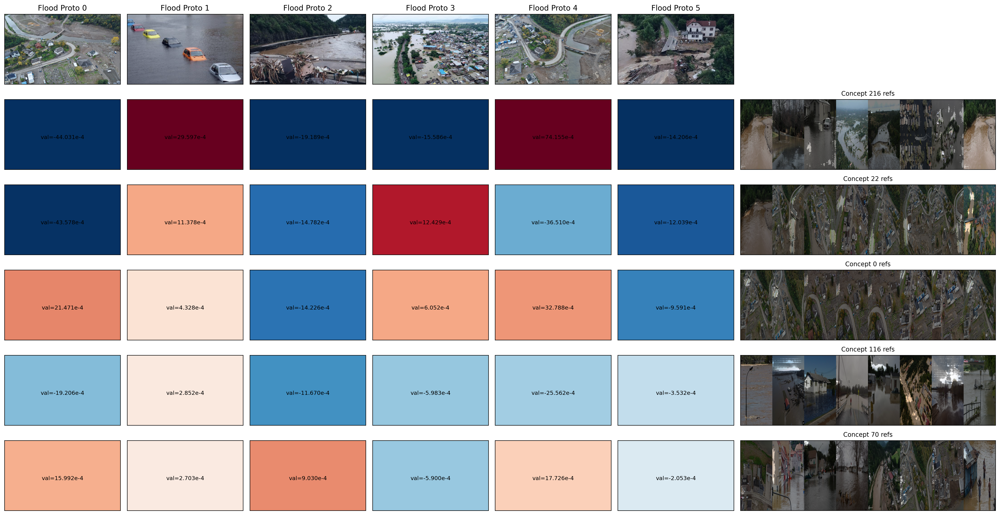

In [19]:
# BIG images + BIG concept boxes; blue for negative; skip proto 6 in plot
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from crp.concepts import ChannelConcept
from crp.image import imgify
from PIL import Image

from src.plot_pcx_pidnet_new import get_ref_images
from crp.helper import get_layer_names

# ---- config ----
N_PROTOTYPES = 7
samples_per_proto = 1
skip_proto = 6  # removed from plot
n_concepts = 5
title_prefix = "Flood Proto"
n_refimgs = 8
ref_imgs_path = globals().get("ref_imgs_path", "../examples/new-ref-img-BRK")

layer_name = "layer4.2.conv1"
class_id_use = class_id if "class_id" in globals() else 1

# image scaling
proto_scale = 2.0
ref_thumb_scale = 2.0

# ---- clustering (robust) ----
if isinstance(attributions, dict):
    X = attributions[layer_name].detach().cpu().numpy()
else:
    X = attributions.detach().cpu().numpy()

unique_rows = np.unique(X, axis=0).shape[0]
if unique_rows < N_PROTOTYPES and "activations" in globals():
    if isinstance(activations, dict):
        X = activations[layer_name].detach().cpu().numpy()
    else:
        X = activations.detach().cpu().numpy()
    unique_rows = np.unique(X, axis=0).shape[0]

labels = None
centers = None
if unique_rows >= N_PROTOTYPES:
    kmeans = KMeans(n_clusters=N_PROTOTYPES, random_state=123, n_init=10)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_

proto_samples = [[] for _ in range(N_PROTOTYPES)]
if labels is not None:
    for k in range(N_PROTOTYPES):
        idx = np.where(labels == k)[0]
        if len(idx) == 0:
            continue
        d = np.linalg.norm(X[idx] - centers[k], axis=1)
        topk = idx[np.argsort(d)[:samples_per_proto]]
        proto_samples[k] = list(map(int, topk))

# fill missing samples globally
used = set(s for lst in proto_samples for s in lst)
remaining = [i for i in range(len(X)) if i not in used]

def pick_farthest(chosen, pool):
    if not pool:
        return None
    if not chosen:
        return pool.pop(0)
    dists = np.min(
        np.linalg.norm(X[pool][:, None, :] - X[list(chosen)][None, :, :], axis=2),
        axis=1
    )
    pick_idx = int(np.argmax(dists))
    return pool.pop(pick_idx)

for k in range(N_PROTOTYPES):
    while len(proto_samples[k]) < samples_per_proto and remaining:
        pick = pick_farthest(used, remaining)
        if pick is None:
            break
        proto_samples[k].append(pick)
        used.add(pick)

# ---- concepts per sample ----
device = next(model.parameters()).device
model.eval()

attribution = ATTRIBUTORS[model_name](model)
composite = COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()])
cc = ChannelConcept()

# ensure fv exists for reference images
if "fv" not in globals():
    layer_names = get_layer_names(model, [torch.nn.Conv2d])
    fv = VISUALIZATIONS[model_name](
        attribution, dataset, layer_names,
        preprocess_fn=lambda x: x, path=output_dir_crp, max_target="max"
    )

def top_concepts_for_sample(sample_id, k=5):
    x, _ = dataset[sample_id]
    x = x.to(device).requires_grad_()
    attr = attribution(x.unsqueeze(0), [{"y": class_id_use}], composite, record_layer=[layer_name])

    # signed per-channel relevance (allow negatives)
    rels = cc.attribute(attr.relevances[layer_name], abs_norm=False)[0]
    topk = torch.topk(rels.abs(), k=k)
    idx = topk.indices.detach().cpu().numpy()
    vals = rels[idx].detach().cpu().numpy()
    return idx, vals

# EXPLICITLY DROP PROTO 6 FROM THE PLOT
plot_indices = [k for k in range(N_PROTOTYPES) if k != skip_proto]

rows_per_sample = n_concepts + 1
total_rows = samples_per_proto * rows_per_sample
total_cols = len(plot_indices) + 1

# layout: prototype row taller; concept rows doubled height
height_ratios = [2.0] + [2.0] * n_concepts
width_ratios = [1.0] * len(plot_indices) + [2.2]

fig, axs = plt.subplots(
    total_rows, total_cols,
    figsize=(3.2 * total_cols, 1.6 * total_rows + 2.0),
    dpi=250,
    facecolor="white",
    gridspec_kw={"height_ratios": height_ratios, "width_ratios": width_ratios}
)
axs = np.atleast_2d(axs)

concept_scores = {}
concept_cache = {}
scale = 1e4
cmap = plt.get_cmap("RdBu_r")

for col, proto_k in enumerate(plot_indices):
    sample_id = proto_samples[proto_k][0]
    row_base = 0

    ax_img = axs[row_base, col]
    img = imgify(dataset[int(sample_id)][0])
    w, h = img.size
    img = img.resize((int(w * proto_scale), int(h * proto_scale)), resample=Image.BICUBIC)
    ax_img.imshow(img, aspect="auto")
    ax_img.set_xticks([]); ax_img.set_yticks([])
    ax_img.set_title(f"{title_prefix} {col}", fontsize=12)

    if sample_id not in concept_cache:
        concept_ids, concept_vals = top_concepts_for_sample(sample_id, k=n_concepts)
        concept_cache[sample_id] = (concept_ids, concept_vals)
    else:
        concept_ids, concept_vals = concept_cache[sample_id]

    vmax = float(np.max(np.abs(concept_vals))) if len(concept_vals) else 1.0
    if vmax == 0:
        vmax = 1.0

    for r in range(n_concepts):
        ax_c = axs[row_base + 1 + r, col]
        val = float(concept_vals[r])
        norm = np.clip(val / vmax, -1, 1)
        ax_c.set_facecolor(cmap((norm + 1) / 2.0))
        ax_c.text(
            0.5, 0.5,
            f"\nval={val*scale:.3f}e-4",
            ha="center", va="center", fontsize=9, color="black"
        )
        ax_c.set_xticks([]); ax_c.set_yticks([])
        for spine in ax_c.spines.values():
            spine.set_visible(True)

        concept_scores[int(concept_ids[r])] = concept_scores.get(int(concept_ids[r]), 0.0) + abs(val)

# ---- right-side concept reference strips (upscaled thumbs) ----
right_col = total_cols - 1
for r in range(total_rows):
    axs[r, right_col].axis("off")

top_concepts = [c for c, _ in sorted(concept_scores.items(), key=lambda kv: kv[1], reverse=True)[:n_concepts]]
ref_imgs = get_ref_images(
    fv=fv, topk_ind=top_concepts, layer_name=layer_name,
    composite=composite, n_ref=n_refimgs, ref_imgs_save_path=ref_imgs_path
)

for i, cid in enumerate(top_concepts):
    ax = axs[i + 1, right_col]
    ax.axis("on")
    ax.set_title(f"Concept {cid} refs", fontsize=10)
    ax.set_xticks([]); ax.set_yticks([])
    imgs = ref_imgs.get(int(cid), [])
    if imgs:
        row_imgs = []
        for im in imgs[:n_refimgs]:
            w, h = im.size
            im_big = im.resize((int(w * ref_thumb_scale), int(h * ref_thumb_scale)), resample=Image.BICUBIC)
            row_imgs.append(torch.from_numpy(np.array(im_big)).permute(2, 0, 1))
        grid = torch.cat(list(row_imgs), dim=2)
        ax.imshow(grid.permute(1, 2, 0), aspect="auto")
    else:
        ax.text(0.5, 0.5, "no refs", ha="center", va="center", fontsize=8)

plt.tight_layout()


In [22]:
# Outlier detection by low GMM likelihood (layer4.2.conv1)
import numpy as np
from sklearn.mixture import GaussianMixture

layer_name = "layer4.2.conv1"
n_outliers = 20

# get attribution matrix for this layer
if isinstance(attributions, dict):
    X = attributions[layer_name].detach().cpu().numpy()
else:
    X = attributions.detach().cpu().numpy()

# clean NaN/Inf
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)

# fit GMM
gmm = GaussianMixture(n_components=7, random_state=0, reg_covar=1e-5).fit(X)

# compute log-likelihood per sample
scores = gmm.score_samples(X)

# lowest likelihood = outliers
outlier_idx = np.argsort(scores)[:n_outliers]

print("Outlier sample indices (lowest likelihood):")
print(outlier_idx.tolist())


/home/heydari/.local/lib/python3.10/site-packages/sklearn/base.py:1363: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


Outlier sample indices (lowest likelihood):
[0, 883, 882, 881, 880, 879, 878, 877, 884, 876, 874, 873, 872, 871, 870, 869, 868, 875, 885, 886]


In [ ]:
import numpy as np
a = np.load("/home/heydari/FHHI-XAI/examples/output/pcx/PCX-BRK-NEW/layer3.1.conv2/activations.npy")
print("shape", a.shape, "nan_count", np.isnan(a).sum(), "nan_rows", np.isnan(a).any(axis=1).sum())


In [ ]:
import numpy as np
p = "/home/heydari/FHHI-XAI/examples/output/pcx/PCX-BRK-NEW/layer3.0.conv1/attributions.npy"
a = np.load(p)
print("shape", a.shape, "nan_count", np.isnan(a).sum(), "nan_rows", np.isnan(a).any(axis=1).sum())

In [ ]:
import numpy as np
p = "/home/heydari/FHHI-XAI/examples/output/crp/CRP-BRK-NEW/RelMax_sum_normed/layer3.0.conv1_rel.npy"
a = np.load(p)
print("shape", a.shape, "nan_count", np.isnan(a).sum(), "nan_rows", np.isnan(a).any(axis=1).sum())